<a href="https://colab.research.google.com/github/baijid024/sawon/blob/master/Covid_19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
df=pd.read_csv('/content/covid_19_clean_complete.csv')
df.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0,Africa


In [ ]:
df.describe()

,Lat,Long,Confirmed,Deaths,Recovered,Active
count,49068.000000,49068.000000,4.906800e+04,49068.000000,4.906800e+04,4.906800e+04
mean,21.433730,23.528236,1.688490e+04,884.179160,7.915713e+03,8.085012e+03
std,24.950320,70.442740,1.273002e+05,6313.584411,5.480092e+04,7.625890e+04
min,-51.796300,-135.000000,0.000000e+00,0.000000,0.000000e+00,-1.400000e+01
25%,7.873054,-15.310100,4.000000e+00,0.000000,0.000000e+00,0.000000e+00
50%,23.634500,21.745300,1.680000e+02,2.000000,2.900000e+01,2.600000e+01
75%,41.204380,80.771797,1.518250e+03,30.000000,6.660000e+02,6.060000e+02
max,71.706900,178.065000,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06


In [ ]:
df.value_counts()

Province/State  Country/Region  Lat      Long       Date        Confirmed  Deaths  Recovered  Active  WHO Region     
Alberta         Canada          53.9333  -116.5765  2020-01-22  0          0       0          0       Americas           1
Ontario         Canada          51.2538  -85.3232   2020-07-19  39434      2794    0          36640   Americas           1
                                                    2020-07-21  39718      2798    0          36920   Americas           1
                                                    2020-07-22  39824      2799    0          37025   Americas           1
                                                    2020-07-23  39936      2799    0          37137   Americas           1
                                                                                                                        ..
Hebei           China           39.5490   116.1306  2020-01-25  8          1       0          7       Western Pacific    1
                                                    2020-01-26  13         1       0          12      Western Pacific    1
                                                    2020-01-27  18         1       0          17      Western Pacific    1
                                                    2020-01-28  33         1       0          32      Western Pacific    1
Zhejiang        China           29.1832   120.0934  2020-07-27  1270       1       1268       1       Western Pacific    1
Name: count, Length: 14664, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Province/State  14664 non-null  object 
 1   Country/Region  49068 non-null  object 
 2   Lat             49068 non-null  float64
 3   Long            49068 non-null  float64
 4   Date            49068 non-null  object 
 5   Confirmed       49068 non-null  int64  
 6   Deaths          49068 non-null  int64  
 7   Recovered       49068 non-null  int64  
 8   Active          49068 non-null  int64  
 9   WHO Region      49068 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 3.7+ MB


Missing Values Checking

In [ ]:
df.isnull().sum()

,0
Province/State,34404
Country/Region,0
Lat,0
Long,0
Date,0
Confirmed,0
Deaths,0
Recovered,0
Active,0
WHO Region,0


Duplicate Checking


In [ ]:
df.duplicated().sum()

0

'Date' to DateTime

In [ ]:
df['Date']=pd.to_datetime(df['Date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province/State  14664 non-null  object        
 1   Country/Region  49068 non-null  object        
 2   Lat             49068 non-null  float64       
 3   Long            49068 non-null  float64       
 4   Date            49068 non-null  datetime64[ns]
 5   Confirmed       49068 non-null  int64         
 6   Deaths          49068 non-null  int64         
 7   Recovered       49068 non-null  int64         
 8   Active          49068 non-null  int64         
 9   WHO Region      49068 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(4), object(3)
memory usage: 3.7+ MB


Time Series Data

In [ ]:
df = df.set_index('Date')
daily_data = df.resample('D').sum()
monthly_data = df.resample('M').sum()
yearly_data = df.resample('Y').sum()

<ipython-input-12-3a34cfba99d4>:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_data = df.resample('M').sum()
<ipython-input-12-3a34cfba99d4>:4: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly_data = df.resample('Y').sum()


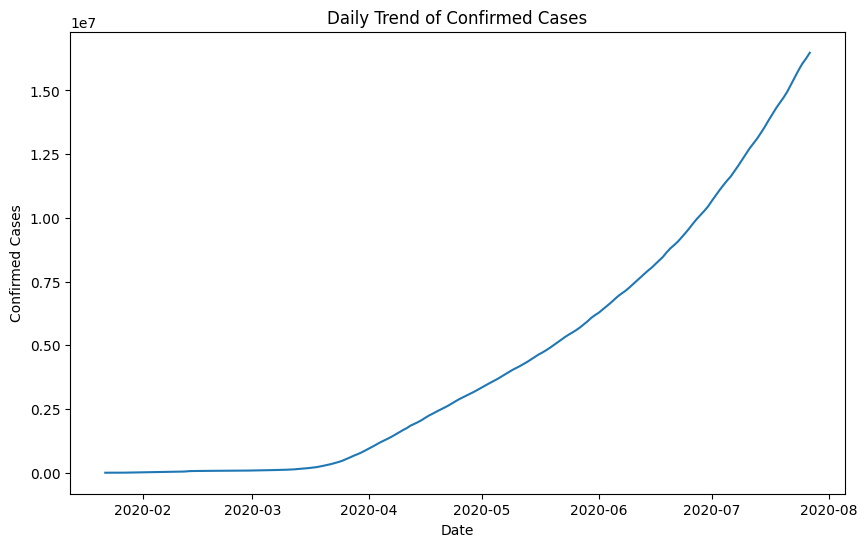

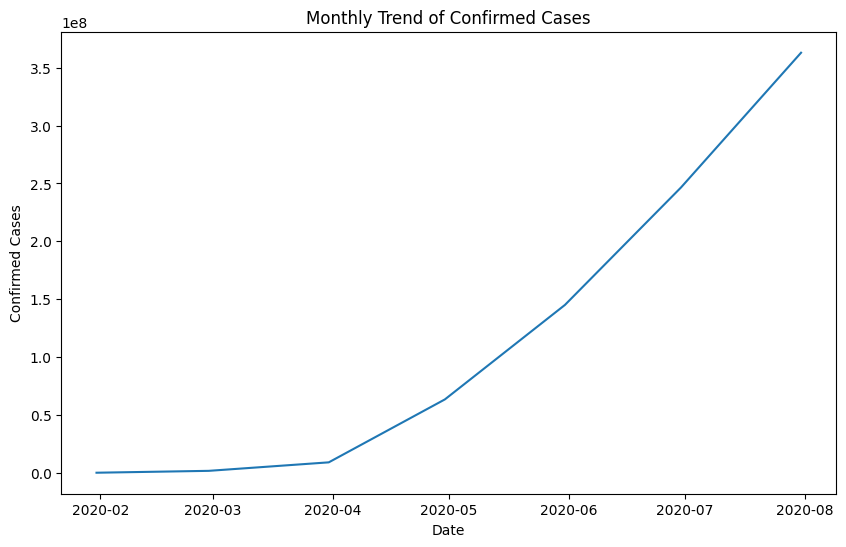

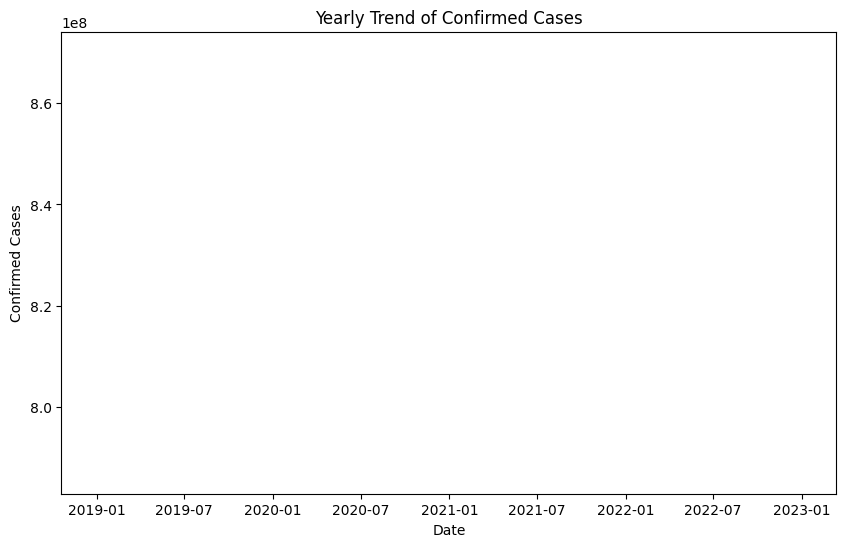

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10,6))
plt.plot(daily_data['Confirmed'])
plt.title('Daily Trend of Confirmed Cases')
plt.xlabel('Date')
plt.ylabel('Confirmed Cases')
plt.show()
plt.figure(figsize=(10,6))
plt.plot(monthly_data['Confirmed'])
plt.title('Monthly Trend of Confirmed Cases')
plt.xlabel('Date')
plt.ylabel('Confirmed Cases')
plt.show()
plt.figure(figsize=(10,6))
plt.plot(yearly_data['Confirmed'])
plt.title('Yearly Trend of Confirmed Cases')
plt.xlabel('Date')
plt.ylabel('Confirmed Cases')
plt.show()

Total cases and Deaths

In [ ]:
df.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', 'Confirmed',
       'Deaths', 'Recovered', 'Active', 'WHO Region'],
      dtype='object')

In [ ]:
df.groupby('Country/Region')[['Confirmed','Deaths']].sum().sort_values(by=['Confirmed', 'Deaths'],
ascending=False).head(20)


,Confirmed,Deaths
Country/Region,,
US,224345948,11011411
Brazil,89524967,3938034
Russia,45408411,619385
India,40883464,1111831
Spain,27404045,3033030
United Kingdom,26748587,3997775
Italy,26745145,3707717
France,21210926,3048524
Germany,21059152,871322


Treand Analysis


In [ ]:
trend=df.groupby(['Country/Region', 'Date'])[['Confirmed','Deaths']].sum().sort_values(by=['Confirmed', 'Deaths'], ascending=False)
trend


Confirmed  Deaths
Country/Region Date                         
US             2020-07-27    4290259  148011
               2020-07-26    4233923  146935
               2020-07-25    4178970  146465
               2020-07-24    4112531  145560
               2020-07-23    4038816  144430
...                              ...     ...
Zimbabwe       2020-03-15          0       0
               2020-03-16          0       0
               2020-03-17          0       0
               2020-03-18          0       0
               2020-03-19          0       0

[35156 rows x 2 columns]

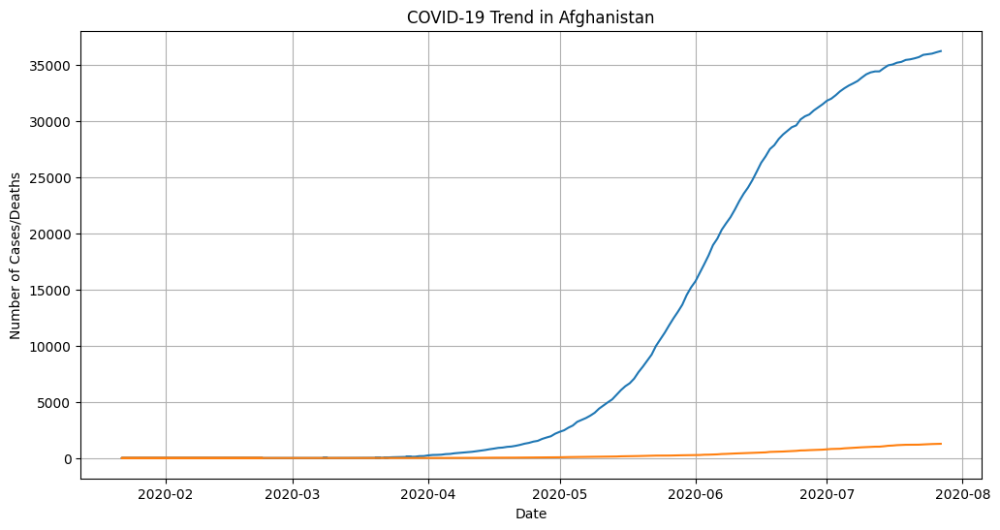

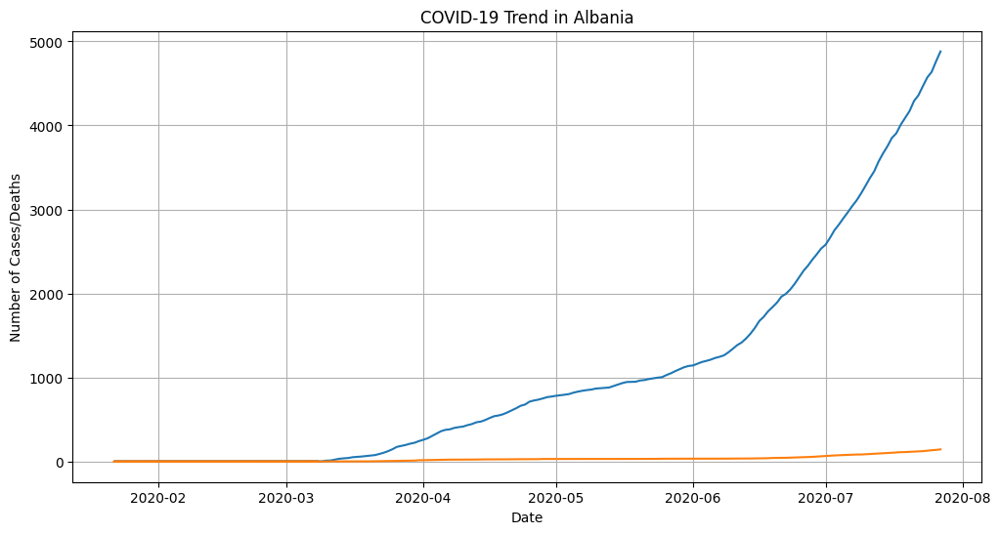

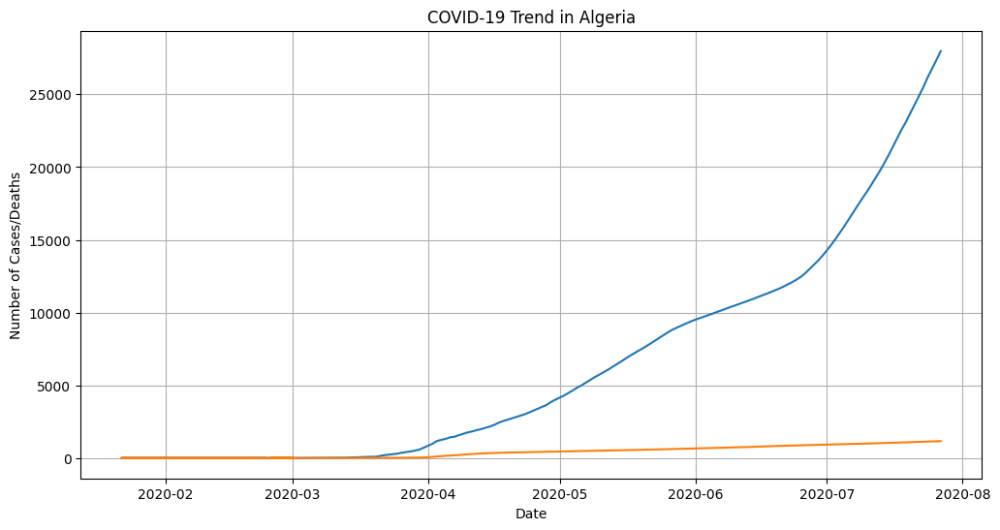

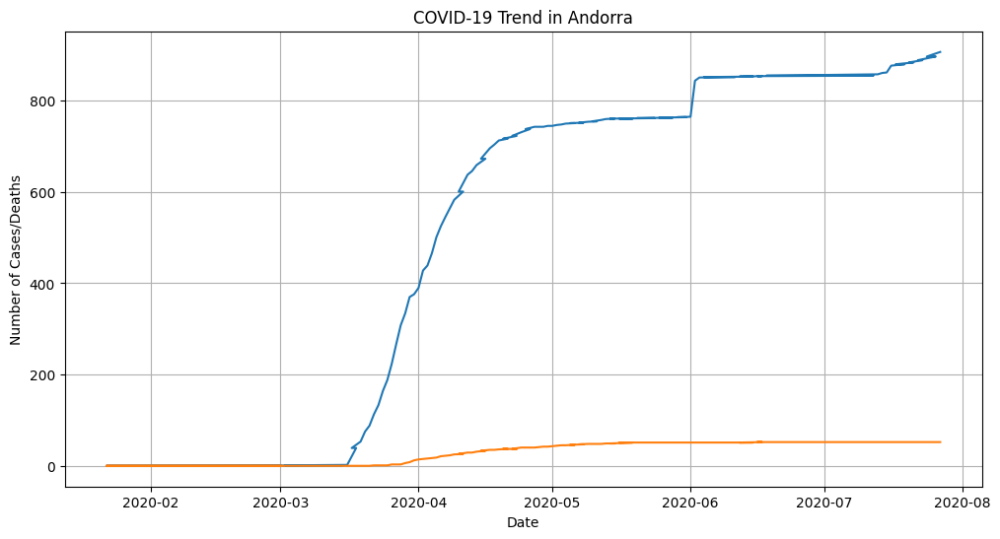

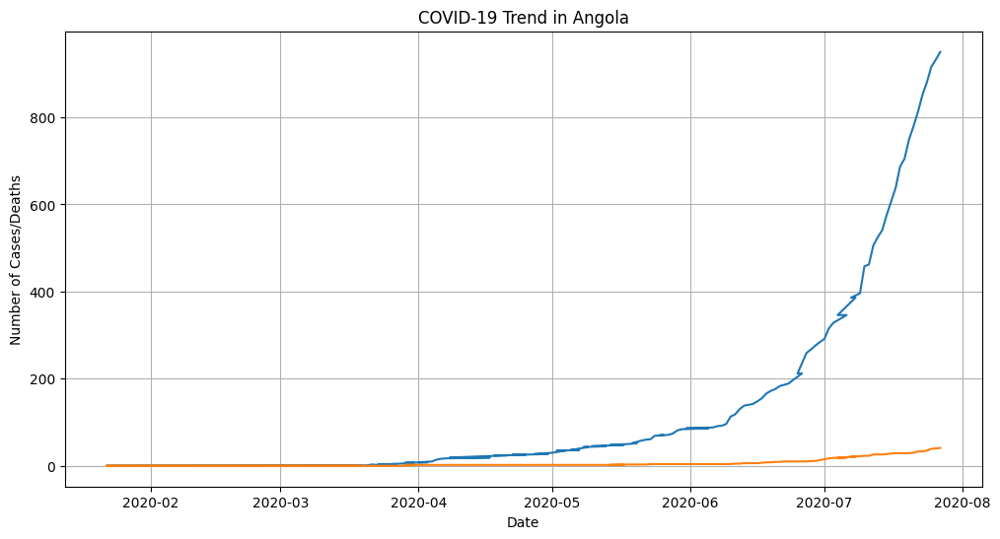

...

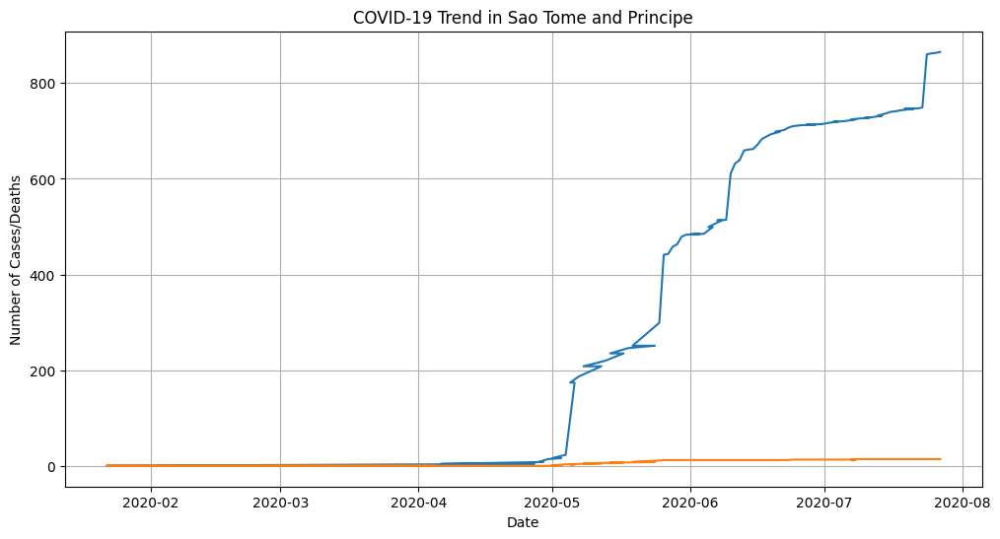

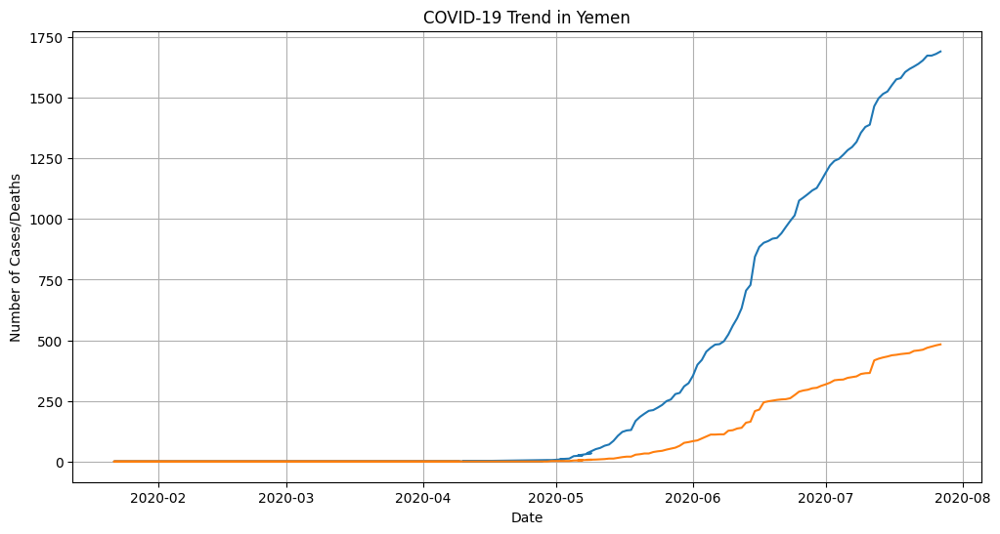

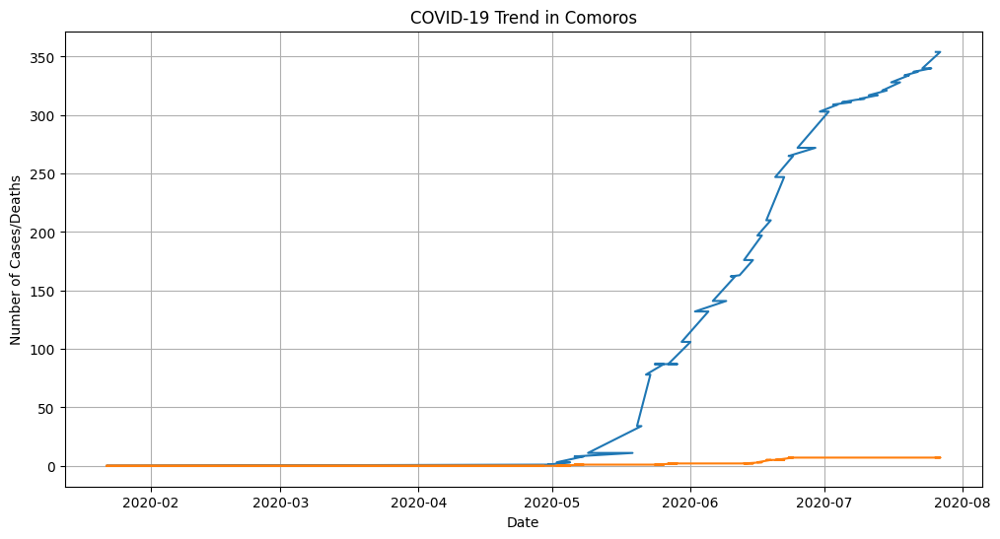

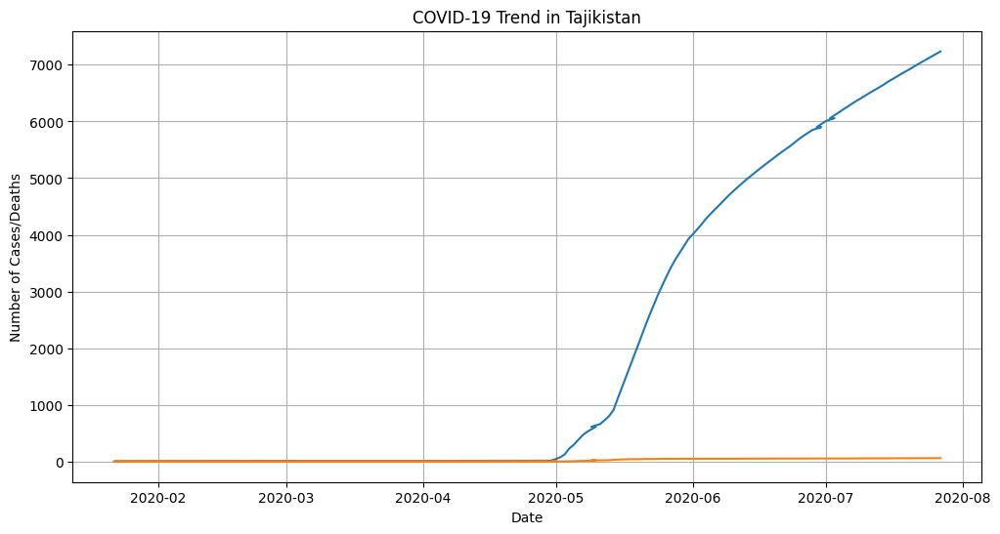

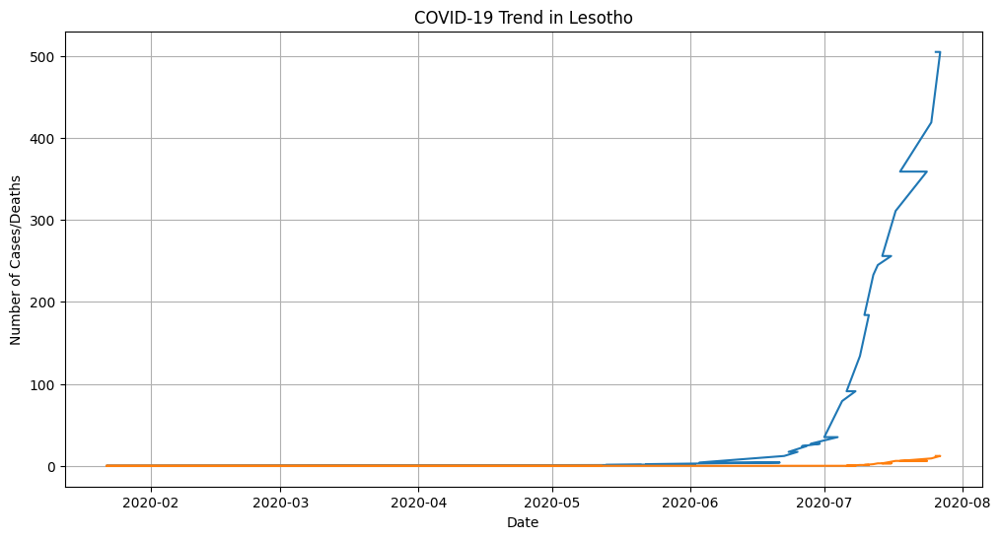

In [ ]:
for country in df['Country/Region'].unique():
 country_data = trend.loc[country]
 plt.figure(figsize=(12, 6))
 plt.plot(country_data.index, country_data['Confirmed'],
label='Confirmed')
 plt.plot(country_data.index, country_data['Deaths'],
label='Deaths')
 plt.title(f'COVID-19 Trend in {country}')
 plt.xlabel('Date')
 plt.ylabel('Number of Cases/Deaths')
 plt.grid(True)
 plt.show()

Geographical Analysis

                       Confirmed    Deaths
Country/Region                            
US                     224345948  11011411
Brazil                  89524967   3938034
Russia                  45408411    619385
India                   40883464   1111831
Spain                   27404045   3033030
...                          ...       ...
Saint Kitts and Nevis       1772         0
Greenland                   1507         0
Holy See                    1356         0
Papua New Guinea            1185         2
Western Sahara               901        63

[187 rows x 2 columns]


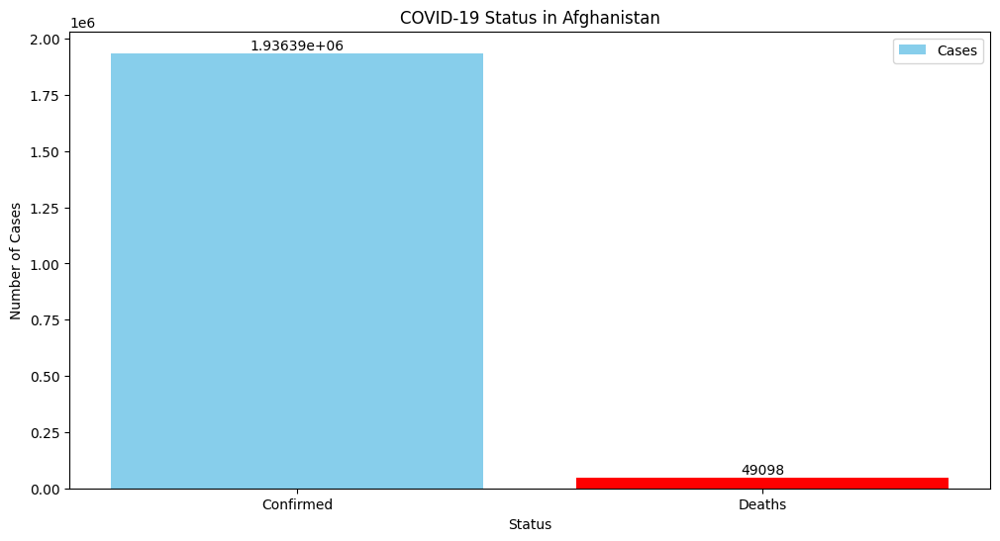

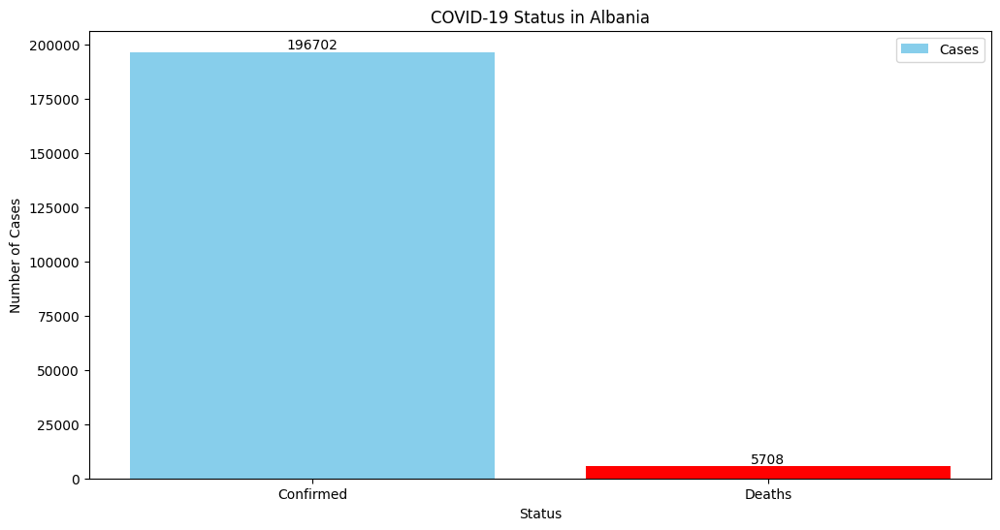

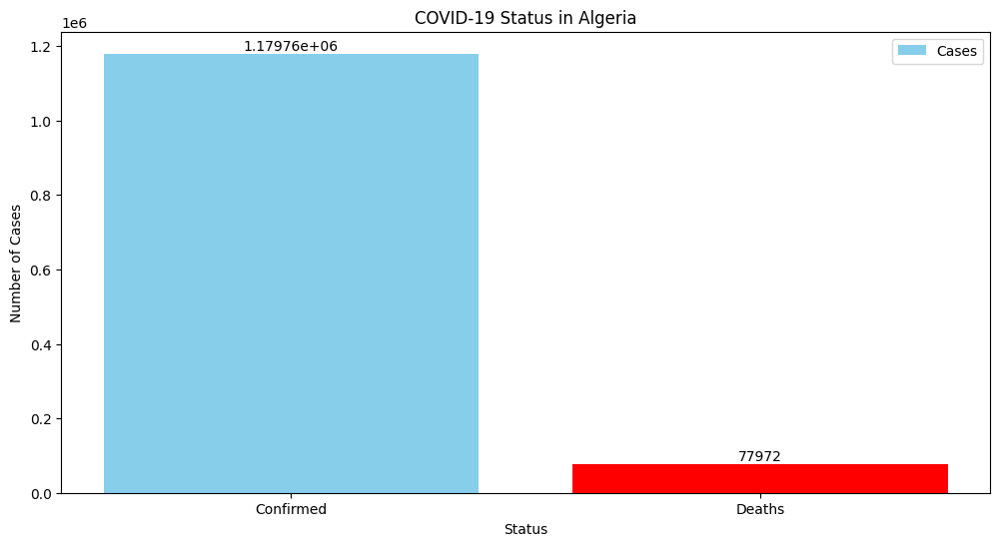

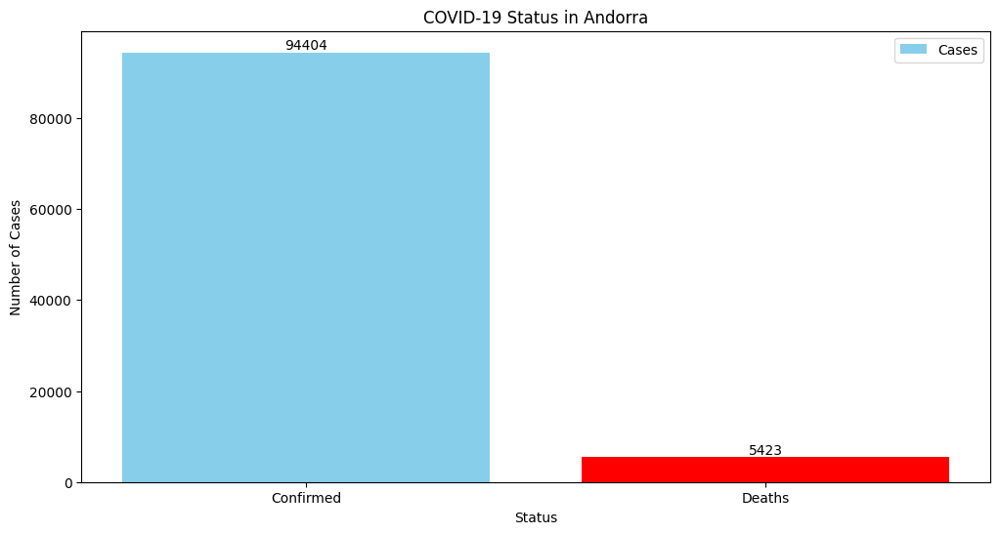

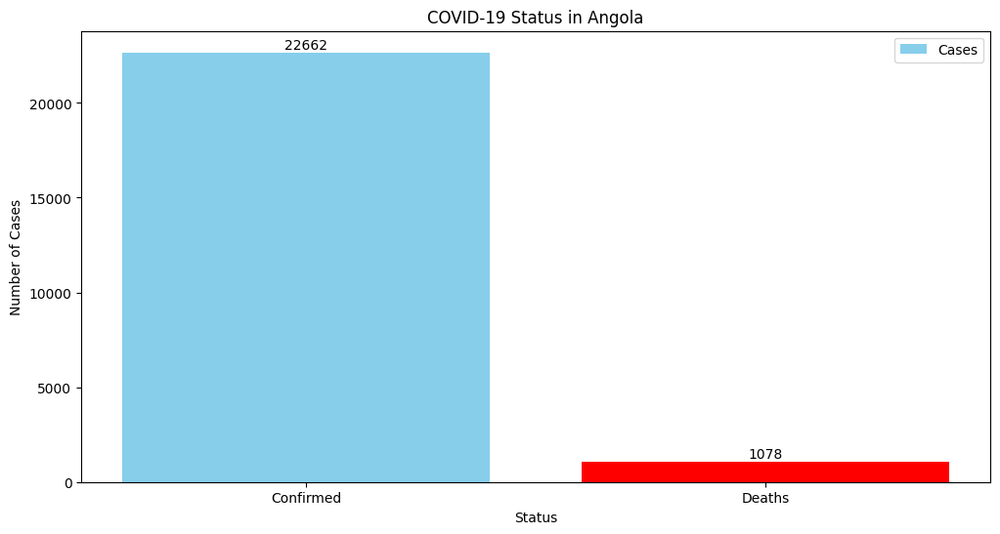

...

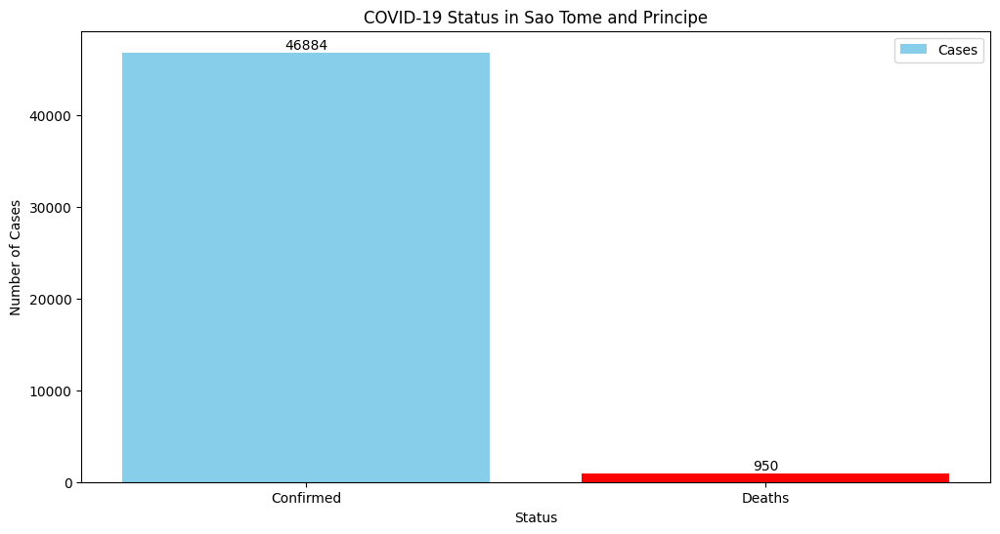

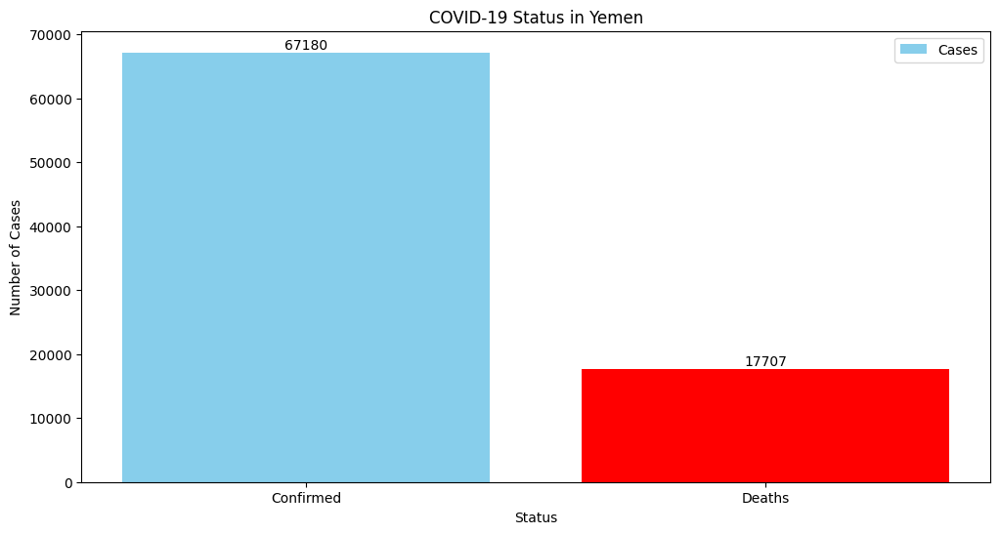

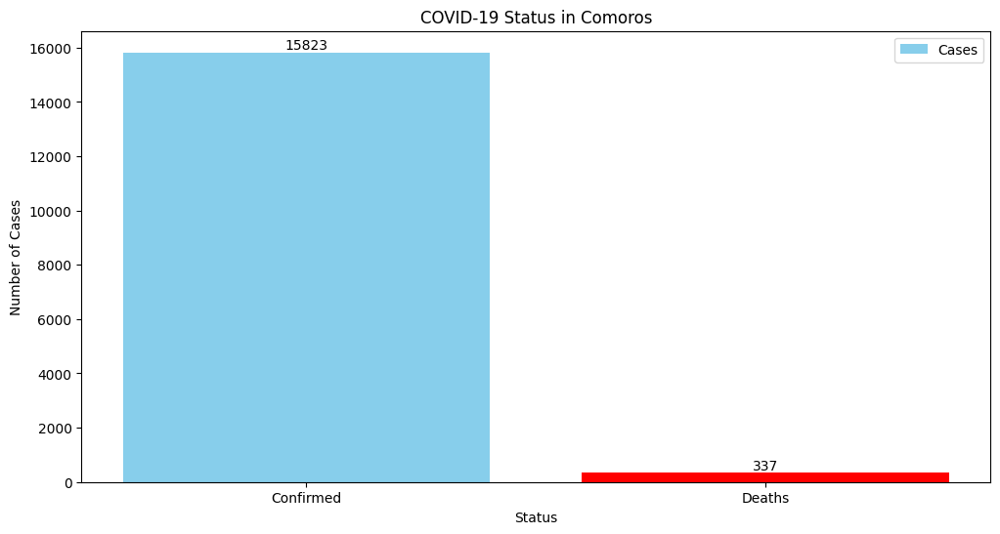

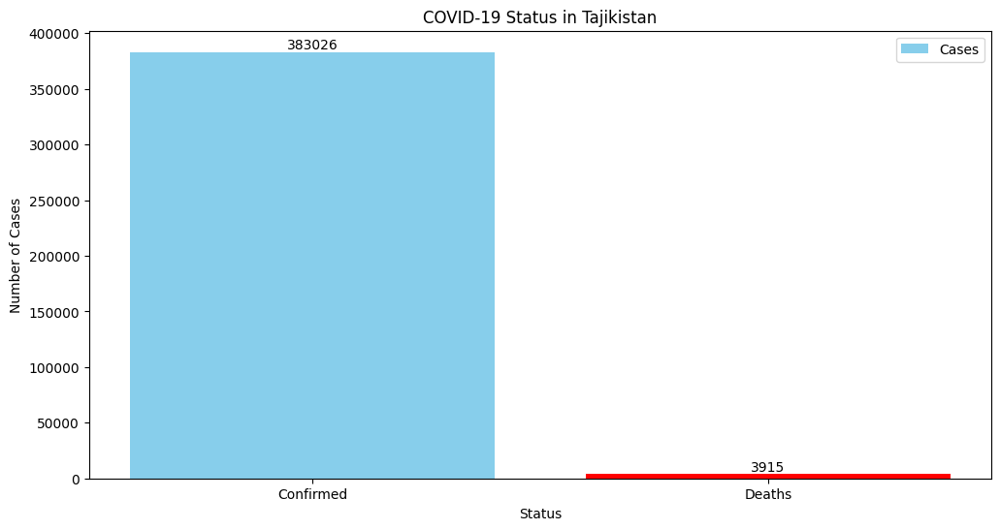

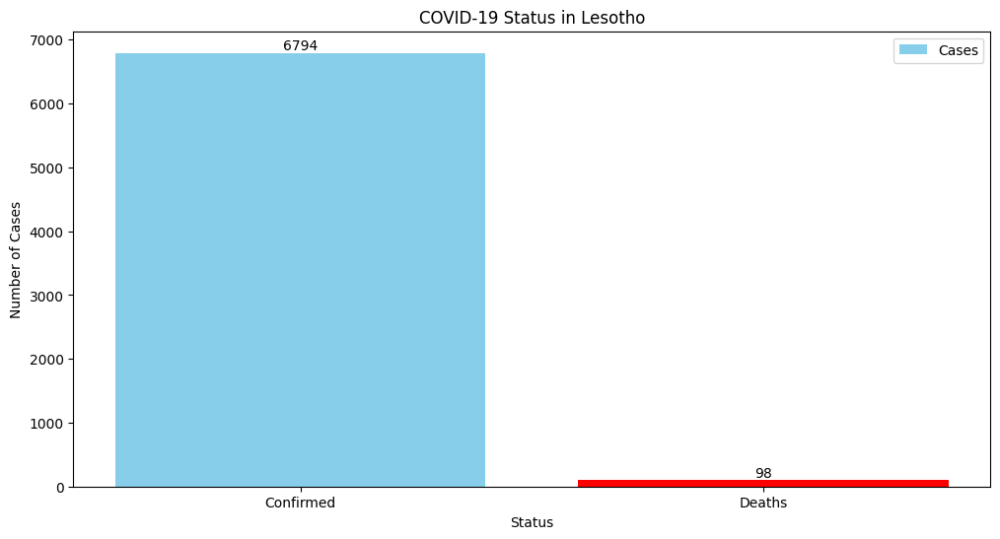

In [ ]:
import seaborn as sns
country_status= df.groupby('Country/Region')[['Confirmed',
'Deaths']].sum().sort_values(by=['Confirmed', 'Deaths'],
ascending=False)
print(country_status)
for country in df['Country/Region'].unique():
 country_data= country_status.loc[country]
 plt.figure(figsize=(12,6))
 colors = ['skyblue', 'red']
 ax=plt.bar(country_data.index, country_data.values, label='Cases',
color=colors)
 plt.bar_label(ax)
 plt.title(f'COVID-19 Status in {country}')
 plt.xlabel('Status')
 plt.ylabel('Number of Cases')
 plt.legend()
 plt.show()


Country-wise Comparison

Highest Confirmed Cases: US (224345948)
Lowest Confirmed Cases (excluding 0): Western Sahara (901)
Highest Deaths: US (11011411)
Lowest Deaths (excluding 0): Papua New Guinea (2)


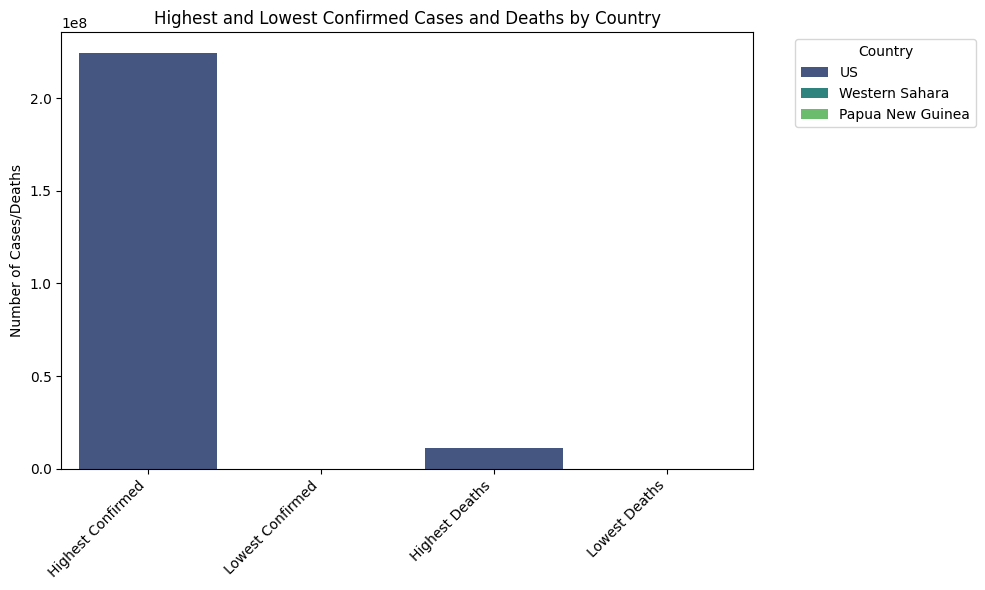

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


country_stats = country_status


highest_confirmed_country = country_stats['Confirmed'].idxmax()
highest_confirmed_cases = country_stats['Confirmed'].max()
lowest_confirmed_country = country_stats[country_stats['Confirmed'] > 0]['Confirmed'].idxmin()
lowest_confirmed_cases = country_stats[country_stats['Confirmed'] > 0]['Confirmed'].min()


highest_deaths_country = country_stats['Deaths'].idxmax()
highest_deaths_cases = country_stats['Deaths'].max()
lowest_deaths_country = country_stats[country_stats['Deaths'] > 0]['Deaths'].idxmin()
lowest_deaths_cases = country_stats[country_stats['Deaths'] > 0]['Deaths'].min()


print(f"Highest Confirmed Cases: {highest_confirmed_country} ({highest_confirmed_cases})")
print(f"Lowest Confirmed Cases (excluding 0): {lowest_confirmed_country} ({lowest_confirmed_cases})")
print(f"Highest Deaths: {highest_deaths_country} ({highest_deaths_cases})")
print(f"Lowest Deaths (excluding 0): {lowest_deaths_country} ({lowest_deaths_cases})")


data = {
    'Category': ['Highest Confirmed', 'Lowest Confirmed', 'Highest Deaths', 'Lowest Deaths'],
    'Country': [highest_confirmed_country, lowest_confirmed_country, highest_deaths_country, lowest_deaths_country],
    'Value': [highest_confirmed_cases, lowest_confirmed_cases, highest_deaths_cases, lowest_deaths_cases]
}
plot_df = pd.DataFrame(data)


plt.figure(figsize=(10, 6))
sns.barplot(x='Category', y='Value', hue='Country', data=plot_df, palette='viridis')
plt.title('Highest and Lowest Confirmed Cases and Deaths by Country')
plt.xlabel('')
plt.ylabel('Number of Cases/Deaths')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Recovery vs. Death Rate

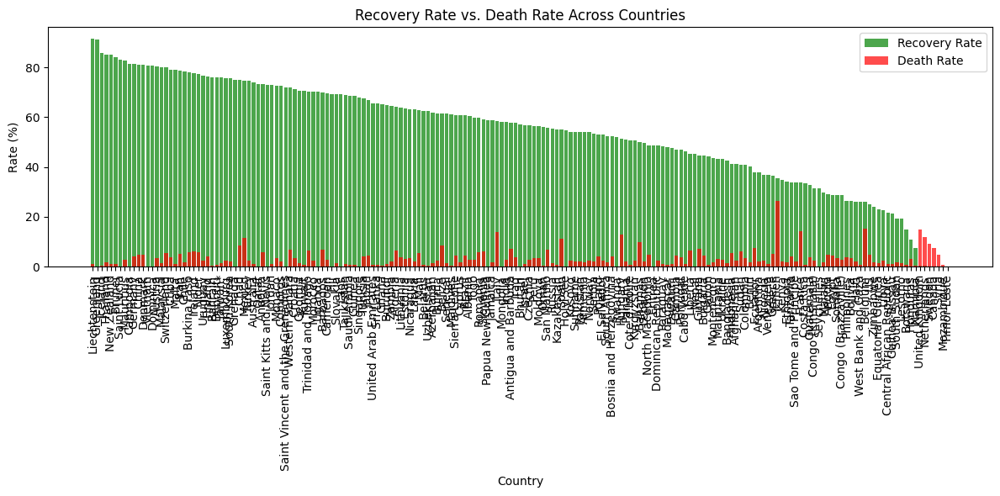

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt




country_data = df.groupby('Country/Region')[['Confirmed', 'Deaths', 'Recovered']].sum()


country_data['Recovery_Rate'] = (country_data['Recovered'] / country_data['Confirmed']) * 100
country_data['Death_Rate'] = (country_data['Deaths'] / country_data['Confirmed']) * 100


country_data = country_data.sort_values(by=['Recovery_Rate', 'Death_Rate'], ascending=[False, False])


plt.figure(figsize=(12, 6))
plt.bar(country_data.index, country_data['Recovery_Rate'], label='Recovery Rate', alpha=0.7, color='green')
plt.bar(country_data.index, country_data['Death_Rate'], label='Death Rate', alpha=0.7, color='red')


plt.xlabel('Country')
plt.ylabel('Rate (%)')
plt.title('Recovery Rate vs. Death Rate Across Countries')
plt.xticks(rotation=90)
plt.legend()


plt.tight_layout()


plt.show()


Precictive Modeling

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA


data = df[df['Country/Region'] == 'Australia']
data = data.groupby('Date')['Confirmed'].sum().reset_index()


data['Date'] = pd.to_datetime(data['Date'])
data = data.set_index('Date')


y = data['Confirmed']
train_size = int(len(y) * 0.7)
y_train, y_test = y[:train_size], y[train_size:]


model = ARIMA(y_train, order=(5, 1, 0))
model_fit = model.fit()


predictions = model_fit.predict(start=len(y_train), end=len(y) - 1, dynamic=False)


mse = mean_squared_error(y_test, predictions)
mse


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


8481265.804198569

Prediction of Deaths

In [ ]:
import pandas as pd
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA


data_deaths = df[df['Country/Region'] == 'Australia']
data_deaths = data_deaths.groupby('Date')['Deaths'].sum().reset_index()


data_deaths['Date'] = pd.to_datetime(data_deaths['Date'])
data_deaths = data_deaths.set_index('Date')


y_deaths = data_deaths['Deaths']


train_size = int(len(y_deaths) * 0.7)
y_train_deaths, y_test_deaths = y_deaths[:train_size], y_deaths[train_size:]


model_deaths = ARIMA(y_train_deaths, order=(5, 1, 0))
model_fit_deaths = model_deaths.fit()


predictions_deaths = model_fit_deaths.predict(
    start=len(y_train_deaths),
    end=len(y_deaths) - 1,
    dynamic=False
)


mse_deaths = mean_squared_error(y_test_deaths, predictions_deaths)


print(f"Mean Squared Error for Deaths Prediction: {mse_deaths}")
print("Predictions for Deaths:")
print(predictions_deaths)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Mean Squared Error for Deaths Prediction: 294.140350877193
Predictions for Deaths:
2020-06-01    103.0
2020-06-02    103.0
2020-06-03    103.0
2020-06-04    103.0
2020-06-05    103.0
2020-06-06    103.0
2020-06-07    103.0
2020-06-08    103.0
2020-06-09    103.0
2020-06-10    103.0
2020-06-11    103.0
2020-06-12    103.0
2020-06-13    103.0
2020-06-14    103.0
2020-06-15    103.0
2020-06-16    103.0
2020-06-17    103.0
2020-06-18    103.0
2020-06-19    103.0
2020-06-20    103.0
2020-06-21    103.0
2020-06-22    103.0
2020-06-23    103.0
2020-06-24    103.0
2020-06-25    103.0
2020-06-26    103.0
2020-06-27    103.0
2020-06-28    103.0
2020-06-29    103.0
2020-06-30    103.0
2020-07-01    103.0
2020-07-02    103.0
2020-07-03    103.0
2020-07-04    103.0
2020-07-05    103.0
2020-07-06    103.0
2020-07-07    103.0
2020-07-08    103.0
2020-07-09    103.0
2020-07-10    103.0
2020-07-11    103.0
2020-07-12    103.0
2020-07-13    103.0
2020-07-14    103.0
2020-07-15    103.0
2020-07-16    103

Accuracy: 1.0
              precision    recall  f1-score   support

        High       1.00      1.00      1.00         7
         Low       1.00      1.00      1.00        17
      Medium       1.00      1.00      1.00        14

    accuracy                           1.00        38
   macro avg       1.00      1.00      1.00        38
weighted avg       1.00      1.00      1.00        38

Correlation between Confirmed Cases and Deaths: 0.9123609953778938


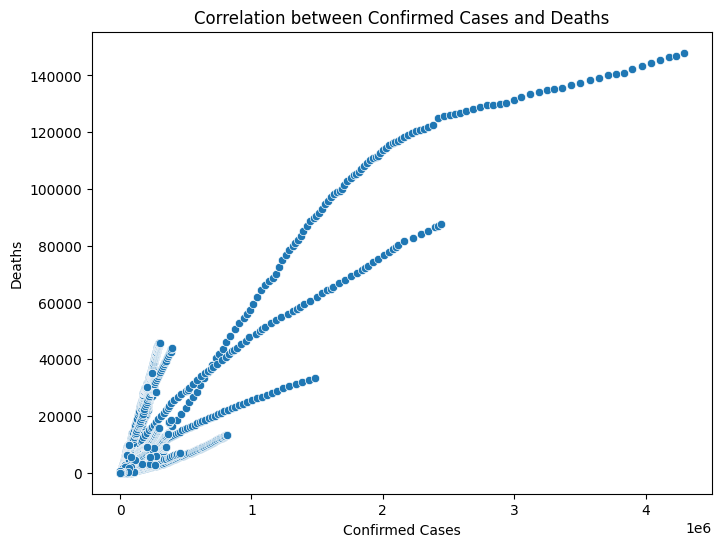

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns


classification_df = df.groupby('Country/Region')[['Confirmed', 'Deaths', 'Recovered']].max().reset_index()


classification_df['Mortality_Rate'] = (classification_df['Deaths'] / classification_df['Confirmed']) * 100
classification_df['Recovery_Rate'] = (classification_df['Recovered'] / classification_df['Confirmed']) * 100


def severity_level(row):
    if row['Mortality_Rate'] > 5:
        return 'High'
    elif row['Mortality_Rate'] > 2:
        return 'Medium'
    else:
        return 'Low'


classification_df['Severity'] = classification_df.apply(severity_level, axis=1)


X = classification_df[['Confirmed', 'Deaths', 'Mortality_Rate', 'Recovery_Rate']]
y = classification_df['Severity']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)


y_pred = model.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")
print(classification_report(y_test, y_pred))


correlation = df['Confirmed'].corr(df['Deaths'])
print(f"Correlation between Confirmed Cases and Deaths: {correlation}")


plt.figure(figsize=(8, 6))
sns.scatterplot(x='Confirmed', y='Deaths', data=df)
plt.title('Correlation between Confirmed Cases and Deaths')
plt.xlabel('Confirmed Cases')
plt.ylabel('Deaths')
plt.show()


Visualization

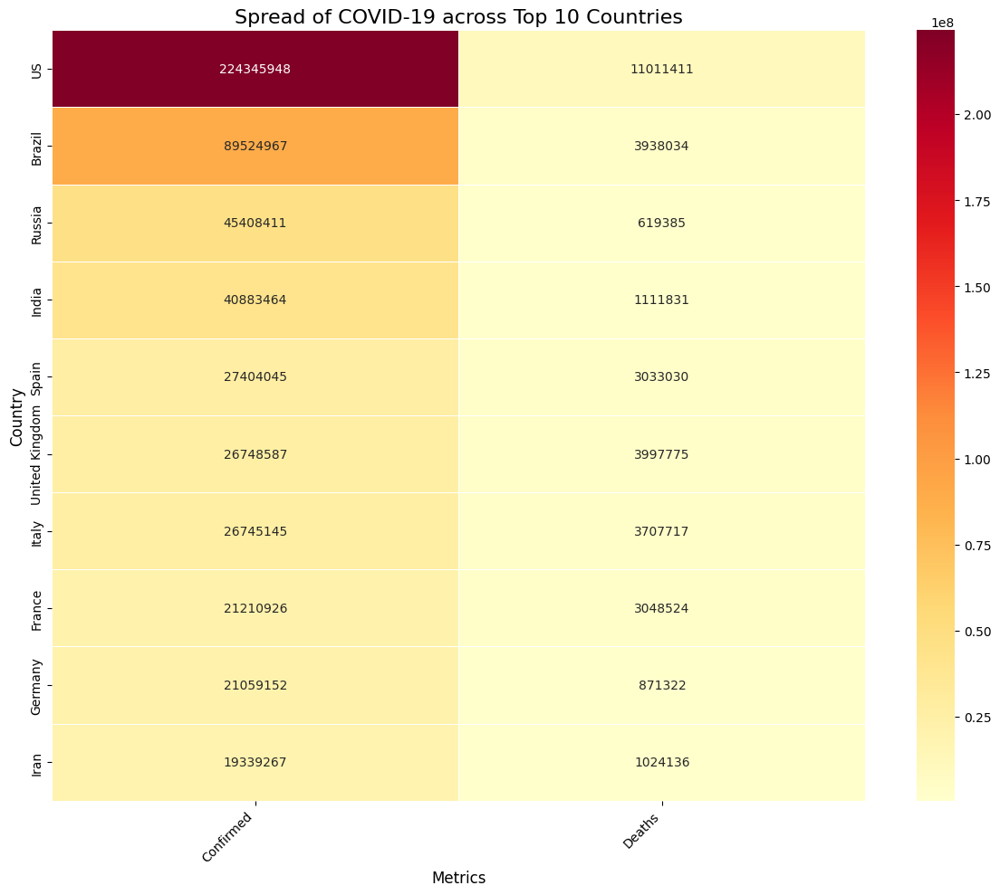

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


country_data = df.groupby('Country/Region')[['Confirmed', 'Deaths']].sum().reset_index()


heatmap_data = country_data.sort_values(by='Confirmed', ascending=False).head(10)


heatmap_data = heatmap_data.set_index('Country/Region')


plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap="YlOrRd", linewidths=.5)


plt.title('Spread of COVID-19 across Top 10 Countries', fontsize=16)
plt.xlabel('Metrics', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


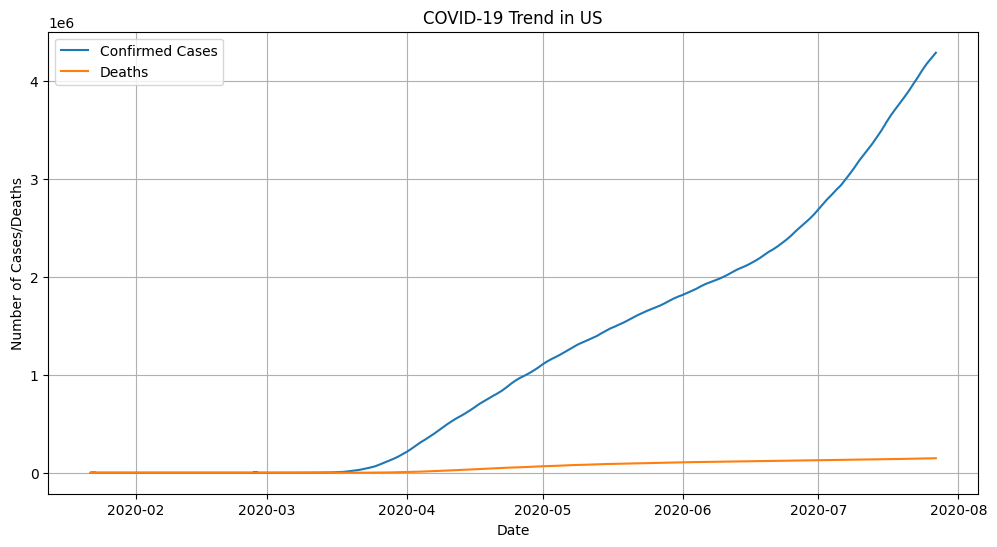

In [ ]:
def visualize_trend(country):
 country_data = trend.loc[country]
 plt.figure(figsize=(12, 6))
 plt.plot(country_data.index, country_data['Confirmed'],
label='Confirmed Cases')
 plt.plot(country_data.index, country_data['Deaths'], label='Deaths')
 plt.title(f'COVID-19 Trend in {country}')
 plt.xlabel('Date')
 plt.ylabel('Number of Cases/Deaths')
 plt.legend()
 plt.grid(True)
 plt.show()
visualize_trend('US')

BarCharts

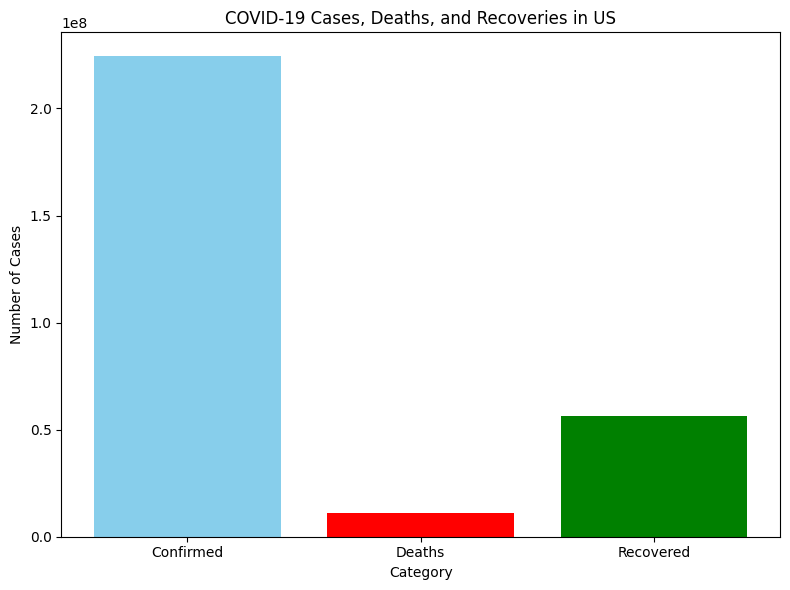

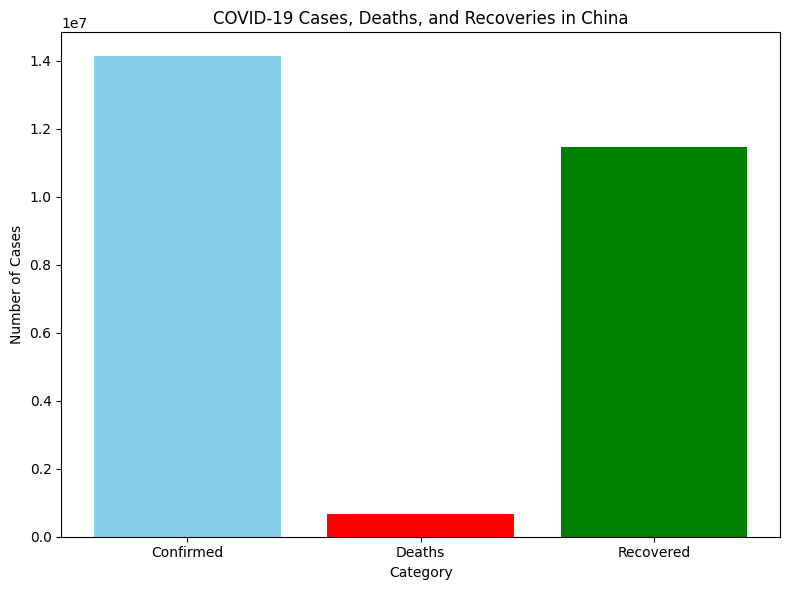

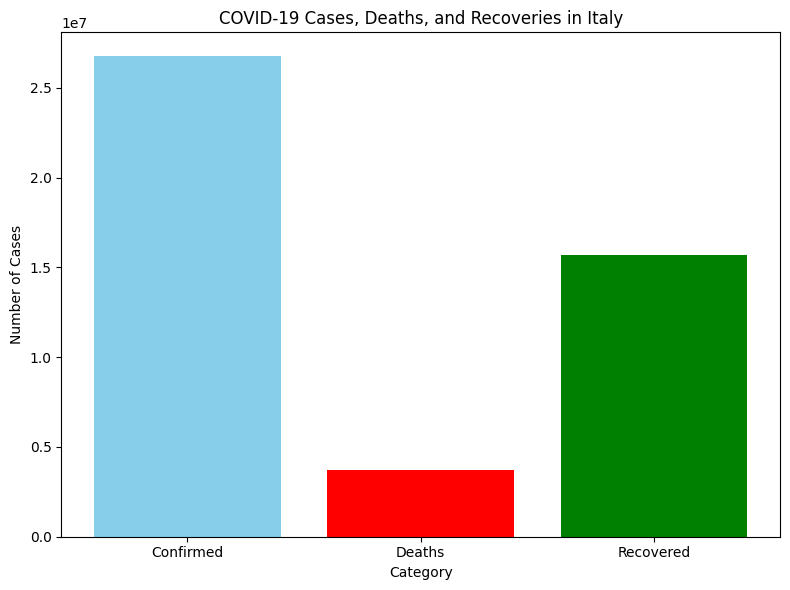

In [ ]:
import matplotlib.pyplot as plt


def create_bar_chart(country_data, country_name):
    categories = ['Confirmed', 'Deaths', 'Recovered']
    values = [country_data['Confirmed'], country_data['Deaths'], country_data['Recovered']]
    plt.figure(figsize=(8, 6))
    plt.bar(categories, values, color=['skyblue', 'red', 'green'])
    plt.title(f'COVID-19 Cases, Deaths, and Recoveries in {country_name}')
    plt.ylabel('Number of Cases')
    plt.xlabel('Category')
    plt.tight_layout()
    plt.show()


grouped_data = df.groupby('Country/Region')[['Confirmed', 'Deaths', 'Recovered']].sum()


countries = ['US', 'China', 'Italy']
for country in countries:
    country_data = grouped_data.loc[country]
    create_bar_chart(country_data, country)


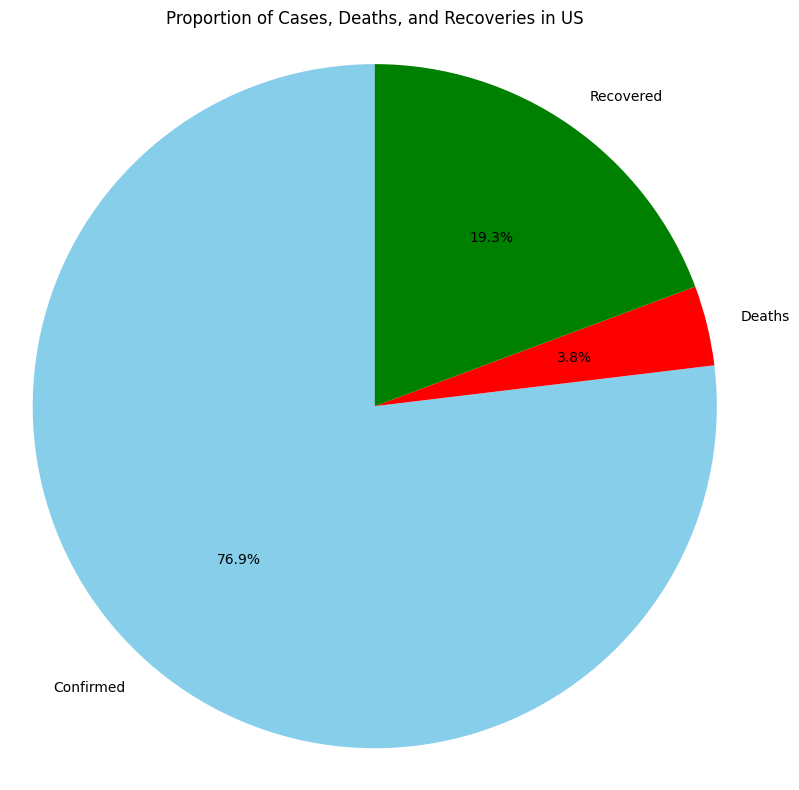

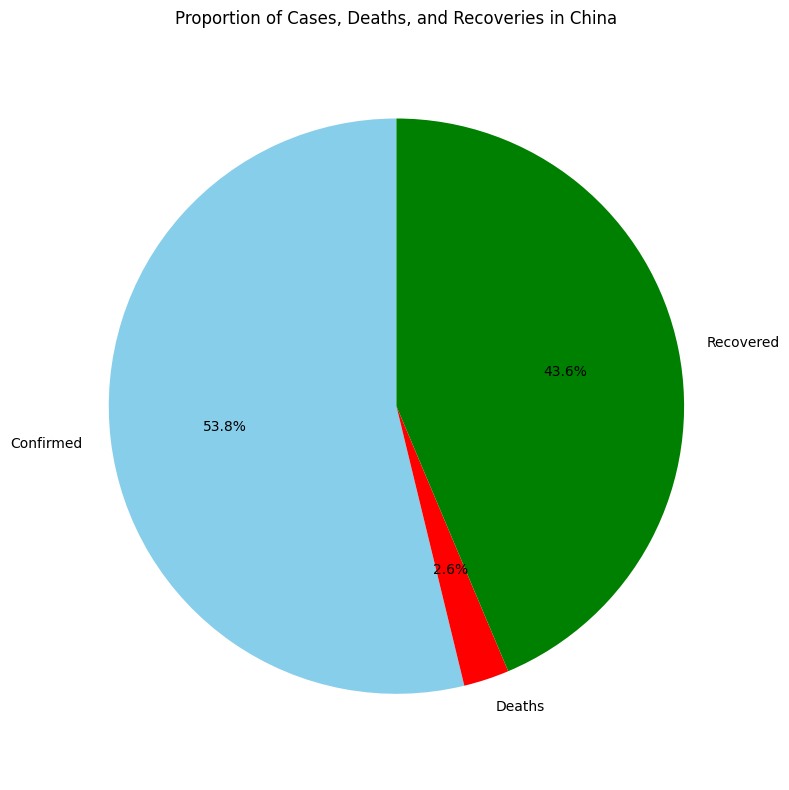

In [ ]:
import matplotlib.pyplot as plt


def plot_country_proportions(country):

    country_data = df.groupby('Country/Region')[['Confirmed', 'Deaths', 'Recovered']].sum().loc[country]


    labels = ['Confirmed', 'Deaths', 'Recovered']
    sizes = [country_data['Confirmed'], country_data['Deaths'], country_data['Recovered']]


    plt.figure(figsize=(8, 8))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'red', 'green'])
    plt.title(f'Proportion of Cases, Deaths, and Recoveries in {country}')
    plt.axis('equal')
    plt.tight_layout()
    plt.show()


plot_country_proportions('US')
plot_country_proportions('China')
